# Force regression Abkowitz model (v2.5)

In [1]:
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
%load_ext autoreload
%autoreload 2
%config Completer.use_jedi = False

In [2]:
import pandas as pd
pd.set_option('display.max_rows', 5000)
pd.set_option('display.max_columns', 5000)
pd.set_option('display.width', 10000)
import numpy as np
import yaml

from vessel_manoeuvring_models.visualization.plot import track_plot, track_plots, plot
from vessel_manoeuvring_models.extended_kalman_vmm import ExtendedKalman, SystemMatrixes
from vmm_abkowitz_simplified import vmm
#from vessel_manoeuvring_models.models.vmm_abkowitz_expanded import abkowitz_model_expanded as vmm

from wPCC_pipeline.pipelines.brix.nodes import initial_parameters, extract_added_masses
from wPCC_pipeline.pipelines.preprocess.nodes import load, add_thrust
from wPCC_pipeline.pipelines.filter_data_extended_kalman.nodes import guess_covariance_matrixes, initial_state, extended_kalman_filter, extended_kalman_smoother
from wPCC_pipeline.pipelines.motion_regression.nodes import predict_force, fit_motions, create_model_from_motion_regression
from wPCC_pipeline.pipelines.prediction.nodes import simulate_euler
from sklearn.metrics import mean_squared_error
from vessel_manoeuvring_models.models.regression import Regression
from vessel_manoeuvring_models.models.vmm import VMM, Simulator, ModelSimulator
from vessel_manoeuvring_models.symbols import *
from vessel_manoeuvring_models.parameters import df_parameters
from vessel_manoeuvring_models.prime_system import PrimeSystem
from wPCC_pipeline.pipelines.vct_data.nodes import vct_scaling
p = df_parameters['symbol']
from vessel_manoeuvring_models.models.diff_eq_to_matrix import DiffEqToMatrix
from vessel_manoeuvring_models.substitute_dynamic_symbols import lambdify, run
import statsmodels.api as sm

import matplotlib.pyplot as plt
plt.style.use('bmh')

from vct.bokeh_plotting import create_tab

Loading BokehJS ...

In [3]:
import anyconfig
globals_path = "../conf/base/globals.yml"
global_variables = anyconfig.load(globals_path)
ships = global_variables["ships"]

In [4]:
ships

['M5064-02-A', 'wPCC', '7m']

In [5]:
%reload_kedro
ship='wPCC'
time_series = catalog.load(f"{ship}.time_series")
df_VCT = catalog.load(f"{ship}.df_VCT")
ship_data = catalog.load(f"{ship}.ship_data")
df_VCT = vct_scaling(data=df_VCT, ship_data=ship_data)
df_VCT['U'] = df_VCT['V']

thrust_keys = catalog.load(f"params:{ship}.thrust_keys")
exclude_parameters = catalog.load(f"params:{ship}.exclude_parameters")
time_series_meta_data = catalog.load(f"{ship}.time_series_meta_data")
time_series_meta_data.index = time_series_meta_data.index.astype(str)
time_series_meta_data.rename(columns={'test_type':'test type'}, inplace=True)

[05/02/23 06:59:42] INFO     Resolved project path as: /home/maa/dev/PHD.                           ]8;id=4888;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=443899;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/ipython/__init__.py#134\134]8;;\
                             To set a different path, run '%reload_kedro <project_root>'                           

[05/02/23 06:59:42] INFO     Kedro project phd                                                      ]8;id=424500;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=957070;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/ipython/__init__.py#103\103]8;;\

                    INFO     Defined global variable 'context', 'session', 'catalog' and            ]8;id=87016;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=21162;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/ipython/__init__.py#104\104]8;;\
                             'pipelines'                                                                           

                    INFO     Loading data from 'wPCC.time_series' (PartitionedDataSet)...       ]8;id=225581;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=150257;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py#343\343]8;;\

                    INFO     Loading data from 'wPCC.df_VCT' (CSVDataSet)...                    ]8;id=20543;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=749753;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py#343\343]8;;\

[05/02/23 06:59:43] INFO     Loading data from 'wPCC.ship_data' (YAMLDataSet)...                ]8;id=651682;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=281454;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py#343\343]8;;\

                    INFO     Loading data from 'params:wPCC.thrust_keys' (MemoryDataSet)...     ]8;id=905490;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=574158;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py#343\343]8;;\

                    INFO     Loading data from 'params:wPCC.exclude_parameters'                 ]8;id=249401;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=261357;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py#343\343]8;;\
                             (MemoryDataSet)...                                                                    

                    INFO     Loading data from 'wPCC.time_series_meta_data' (CSVDataSet)...     ]8;id=456568;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=155115;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py#343\343]8;;\

In [6]:
df_VCT.head()

,level_0,Dp,S,S_Xgrid,S_inner_bracket_port,S_inner_bracket_stb,S_outer_bracket_port,S_outer_bracket_stb,S_rudder_port,S_rudder_stb,S_shaft_port_assembly,S_shaft_port_shaft1,S_shaft_port_shaft2,S_shaft_stb_assembly,S_shaft_stb_shaft1,S_shaft_stb_shaft2,V,beta,delta,fx,fx_Xgrid,fx_inner_bracket_port,fx_inner_bracket_stb,fx_outer_bracket_port,fx_outer_bracket_stb,fx_rudder_port,fx_rudder_stb,fx_shaft_port_assembly,fx_shaft_port_shaft1,fx_shaft_port_shaft2,fx_shaft_stb_assembly,fx_shaft_stb_shaft1,fx_shaft_stb_shaft2,fy,fy_Xgrid,fy_inner_bracket_port,fy_inner_bracket_stb,fy_outer_bracket_port,fy_outer_bracket_stb,fy_rudder_port,fy_rudder_stb,fy_shaft_port_assembly,fy_shaft_port_shaft1,fy_shaft_port_shaft2,fy_shaft_stb_assembly,fy_shaft_stb_shaft1,fy_shaft_stb_shaft2,fz,fz_Xgrid,fz_inner_bracket_port,fz_inner_bracket_stb,fz_outer_bracket_port,fz_outer_bracket_stb,fz_rudder_port,fz_rudder_stb,fz_shaft_port_assembly,fz_shaft_port_shaft1,fz_shaft_port_shaft2,fz_shaft_stb_assembly,fz_shaft_stb_shaft1,fz_shaft_stb_shaft2,g,lpp,mx,mx_Xgrid,mx_inner_bracket_port,mx_inner_bracket_stb,mx_outer_bracket_port,mx_outer_bracket_stb,mx_rudder_port,mx_rudder_stb,mx_shaft_port_assembly,mx_shaft_port_shaft1,mx_shaft_port_shaft2,mx_shaft_stb_assembly,mx_shaft_stb_shaft1,mx_shaft_stb_shaft2,my,my_Xgrid,my_inner_bracket_port,my_inner_bracket_stb,my_outer_bracket_port,my_outer_bracket_stb,my_rudder_port,my_rudder_stb,my_shaft_port_assembly,my_shaft_port_shaft1,my_shaft_port_shaft2,my_shaft_stb_assembly,my_shaft_stb_shaft1,my_shaft_stb_shaft2,mz,mz_Xgrid,mz_inner_bracket_port,mz_inner_bracket_stb,mz_outer_bracket_port,mz_outer_bracket_stb,mz_rudder_port,mz_rudder_stb,mz_shaft_port_assembly,mz_shaft_port_shaft1,mz_shaft_port_shaft2,mz_shaft_stb_assembly,mz_shaft_stb_shaft1,mz_shaft_stb_shaft2,r,result_file_path,rho,u,v,name,path,thrust,rev,p,phi,model_name,S_BK_port1,S_BK_stb1,fx_BK_port1,fx_BK_stb1,fy_BK_port1,fy_BK_stb1,fz_BK_port1,fz_BK_stb1,mx_BK_port1,mx_BK_stb1,my_BK_port1,my_BK_stb1,mz_BK_port1,mz_BK_stb1,S_daggerboard_middle,fx_daggerboard_middle,fy_daggerboard_middle,fz_daggerboard_middle,mx_daggerboard_middle,my_daggerboard_middle,mz_daggerboard_middle,S_R4083_ref,fx_R4083_ref,fy_R4083_ref,fz_R4083_ref,mx_R4083_ref,my_R4083_ref,mz_R4083_ref,S_Rudder_Center,S_Rudder_Port,S_Rudder_Starboard,S_hull,S_rudder,fx_Rudder_Center,fx_Rudder_Port,fx_Rudder_Starboard,fx_hull,fx_rudder,fy_Rudder_Center,fy_Rudder_Port,fy_Rudder_Starboard,fy_hull,fy_rudder,fz_Rudder_Center,fz_Rudder_Port,fz_Rudder_Starboard,fz_hull,fz_rudder,mx_Rudder_Center,mx_Rudder_Port,mx_Rudder_Starboard,mx_hull,mx_rudder,my_Rudder_Center,my_Rudder_Port,my_Rudder_Starboard,my_hull,my_rudder,mz_Rudder_Center,mz_Rudder_Port,mz_Rudder_Starboard,mz_hull,mz_rudder,torque,test type,eta0,eta0_round,fx_rudders,fy_rudders,fz_rudders,mx_rudders,my_rudders,mz_rudders,clr,S_daggerboard_port,S_daggerboard_stb,fake_index,fx_daggerboard_port,fx_daggerboard_stb,fy_daggerboard_port,fy_daggerboard_stb,fz_daggerboard_port,fz_daggerboard_stb,mx_daggerboard_port,mx_daggerboard_stb,my_daggerboard_port,my_daggerboard_stb,mz_daggerboard_port,mz_daggerboard_stb,$\frac{fx}{V^2}$,$\frac{fy}{V^2}$,$\frac{mz}{V^2}$,U
0,165,7.3,7375.872,7277.256591,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.961770,0.0,-0.000000,-3.734836,-252076.078409,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.018717,-295.088406,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-84.064735,-5.881622e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.80665,196.0,0.000201,-1085.233044,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,214.251016,6.178902e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.042926,2.386122e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,L:\proj2019\40199079-Segelfartyg-Wallenius\VCT...,1025.0,0.961770,-0.0,12knotsResistance,L:\proj2019\40199079-Segelfartyg-Wallenius\VCT...,0.0,0.0,0,0,HERO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,98.619465,-9118.015350,-101

In [7]:
df_VCT['test type'].unique()

array(['resistance', 'Rudder angle', 'Drift angle',
       'Rudder and drift angle', 'Circle', 'Circle + Drift',
       'self propulsion', 'Thrust variation', 'Rudder and circle'],
      dtype=object)

In [8]:
df_VCT['model_name'].unique()

array(['HERO', 'HS5012-01', 'HS5013-01', 'HS5013-01-FS-BK',
       'HS5013-01-FS-Sail', 'HS5013-01-MS-BK',
       'HS5013-01-MS-diagonal_foils', 'HS5013-01-Sail-baseline',
       'HS5013-01-bottom_daggerboard', 'HS5013-01-diagonal_foils',
       'HS5013-01_power', 'HS5013_01_power', 'Hull3_0', 'V2_3_R2',
       'V2_3_R2_NewBrackets', 'V2_4_R1', 'V2_5_MDL_modelScale', 'V2_5_R1',
       'V2_5_R2', 'V2_5_R3', 'V2_5_scaling_investigation', 'V3_0',
       'V3_0_R1'], dtype=object)

In [9]:
mask = df_VCT['model_name'].isin([
    'V2_5_MDL_modelScale', 
    #'V2_5_R1',
    #'V2_5_R2', 'V2_5_R3'
])
df = df_VCT.loc[mask]

In [10]:
parameters = initial_parameters(ship_data=ship_data)
added_masses = extract_added_masses(parameters=parameters)

In [11]:
X_eq = vmm.X_eq.subs([
    (p.Xrr,0),
    #(p.Xvr,0),
    (p.Xuu,0),
])
Y_eq = vmm.Y_eq.subs([
    (p.Yr,0),
    (p.Yur,0),
    (p.Ythrust,0),
    (p.Yu,0),
    (p.Yuv,0),
    (p.Yvvdelta,0),
    
])
Y_eq = sp.Eq(Y_eq.lhs, Y_eq.rhs + p.Yvvv*v**3 + p.Yvr*v*r + p.Yr*r)

N_eq = vmm.N_eq.subs([
    (p.Nu,0),
    (p.Nvvdelta,0),
    (p.Nthrust,0),
    #(p.Nr,0),
    
])
N_eq = sp.Eq(N_eq.lhs, N_eq.rhs + p.Nrrr*r**3)

vmm2 = VMM(X_eq=X_eq, Y_eq=Y_eq, N_eq=N_eq)

In [12]:
exclude_parameters_ = exclude_parameters.copy()
#exclude_parameters_['Ythrustdelta']=0.8  # Guessing
#exclude_parameters_['Nthrustdelta']=exclude_parameters_['Ythrustdelta']*ship_data['x_r']/ship_data['L']

In [13]:
interesting = ["u", "v", "r", "U", "delta", "thrust", "fx", "fy", "mz"]
df_ = df[interesting].copy()

regression = Regression(
    vmm=vmm2,
    data=df_,
    added_masses=added_masses,
    ship_parameters=ship_data,
    exclude_parameters=exclude_parameters_,
    connect_equations_Y_N_rudder=False,
)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                     fx   R-squared (uncentered):                   0.995
Model:                            OLS   Adj. R-squared (uncentered):              0.994
Method:                 Least Squares   F-statistic:                              2074.
Date:                Tue, 02 May 2023   Prob (F-statistic):                    1.23e-37
Time:                        06:59:45   Log-Likelihood:                          301.76
No. Observations:                  36   AIC:                                     -597.5
Df Residuals:                      33   BIC:                                     -592.8
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Xu             -0.0007   1.15e-05    -64.175      0.000      -0.001      -0.001
Xdeltadelta    -0.0024      0.001     -4.170      0.000      -0.004      -0.001
Xvr            -0.0021      0.001     -1.624      0.114      -0.005       0.001
==============================================================================
Omnibus:                        6.623   Durbin-Watson:                   1.208
Prob(Omnibus):                  0.036   Jarque-Bera (JB):                3.928
Skew:                          -0.618   Prob(JB):                        0.140
Kurtosis:                       1.956   Cond. No.                         132.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                     fy   R-squared (uncentered):                   0.999
Model:                            OLS   Adj. R-squared (uncentered):              0.999
Method:                 Least Squares   F-statistic:                              6769.
Date:                Tue, 02 May 2023   Prob (F-statistic):                    4.11e-46
Time:                        06:59:45   Log-Likelihood:                          318.40
No. Observations:                  36   AIC:                                     -626.8
Df Residuals:                      31   BIC:                                     -618.9
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Ydelta         0.0051   7.47e-05     67.883      0.000       0.005       0.005
Yr             0.0027   4.51e-05     60.968      0.000       0.003       0.003
Yv            -0.0095      0.000    -48.088      0.000      -0.010      -0.009
Yvvv          -0.1360      0.009    -15.784      0.000      -0.154      -0.118
Yvr            0.0115      0.001     11.139      0.000       0.009       0.014
==============================================================================
Omnibus:                        1.737   Durbin-Watson:                   1.800
Prob(Omnibus):                  0.419   Jarque-Bera (JB):                1.461
Skew:                           0.481   Prob(JB):                        0.482
Kurtosis:                       2.780   Cond. No.                         230.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                     mz   R-squared (uncentered):                   0.991
Model:                            OLS   Adj. R-squared (uncentered):              0.990
Method:                 Least Squares   F-statistic:                              718.7
Date:                Tue, 02 May 2023   Prob (F-statistic):                    4.52e-31
Time:                        06:59:45   Log-Likelihood:                          308.16
No. Observations:                  36   AIC:                                     -606.3
Df Residuals:                      31   BIC:                                     -598.4
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Ndelta        -0.0025   9.83e-05    -25.529      0.000      -0.003      -0.002
Nr            -0.0023      0.000    -21.016      0.000      -0.002      -0.002
Nv            -0.0017      0.000     -7.202      0.000      -0.002      -0.001
Nrrr          -0.0018      0.001     -2.571      0.015      -0.003      -0.000
Nvvv           0.0053      0.011      0.487      0.630      -0.017       0.028
==============================================================================
Omnibus:                       35.222   Durbin-Watson:                   0.874
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              105.531
Skew:                           2.232   Prob(JB):                     1.21e-23
Kurtosis:                      10.101   Cond. No.                         221.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

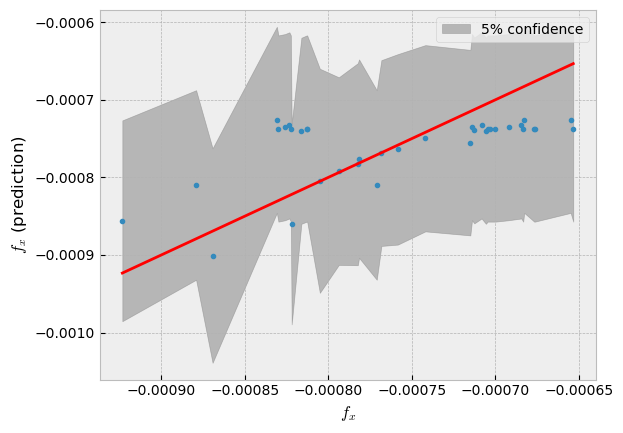

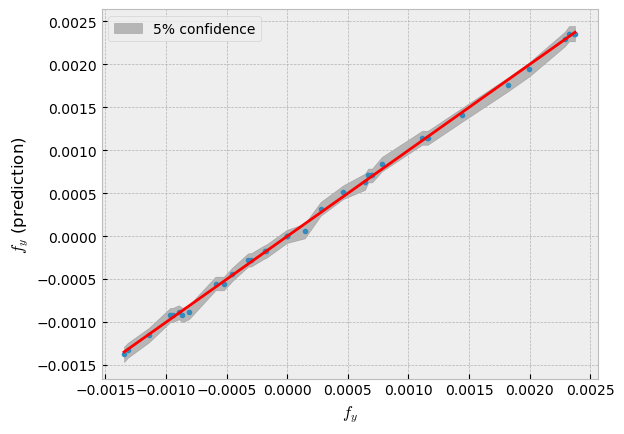

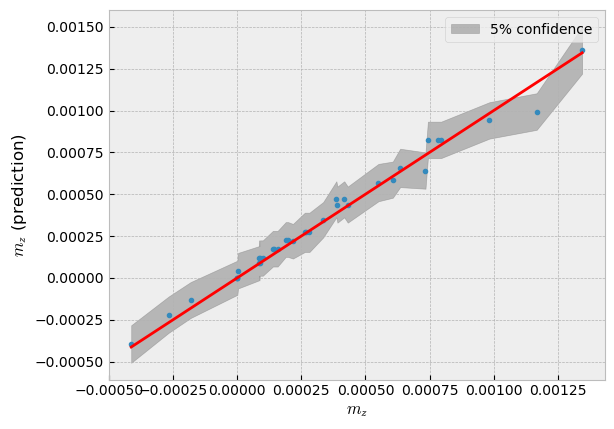

In [14]:
regression.show()

In [15]:
df_predict = regression.predict(data=df_)
df_predict = pd.merge(left=df_predict, right=df, how='left', left_index=True, right_index=True, suffixes=('','_vct'))
df_predict['model_name'] = 'model'

In [16]:
results = pd.concat([df,df_predict])

In [17]:
create_tab(df_VCT=results, ys=['fx', 'fy', 'mz'])

Tabs(id='5054', ...)

## Simulation

In [18]:
time_series_meta_data[['test type','comment','ship_speed']]

,test type,comment,ship_speed
id,,,
22639,reference speed,8.0 kn,0.641180
22638,reference speed,8.0 kn,0.641180
22637,reference speed,8.0 kn,0.641180
22636,reference speed,8.0 kn,0.641180
22634,reference speed,10.0 kn,0.801475
22635,reference speed,10.0 kn,0.801475
22633,reference speed,10.0 kn,0.801475
22632,reference speed,10.0 kn,0.801475
22631,reference speed,10.0 kn,0.801475


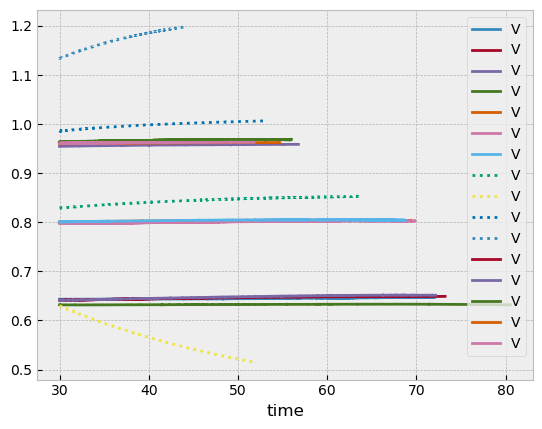

In [19]:
fig,ax=plt.subplots()
_ = []
for id, meta_data in time_series_meta_data.groupby(by='test type').get_group('reference speed').iterrows():
    df_ = time_series[str(id)]()
    df_ = load(raw_data=df_)
    df_ = add_thrust(df_, thrust_channels=thrust_keys)
    
    if abs(df_.iloc[0:100]['V'].mean() - df_.iloc[-100:]['V'].mean()) < 0.05:
        style='-'
        
        _.append(df_.mean())
        
    else:
        style=':'
    
    df_.rolling(window=3000).mean().plot(y='V', style=style, ax=ax)
    
df_reference_speeds = pd.DataFrame(_)
df_reference_speeds['resistance'] = exclude_parameters['Xthrust']*df_reference_speeds['thrust']
df_reference_speeds['fx'] = df_reference_speeds['thrust'] - df_reference_speeds['resistance']
df_reference_speeds.sort_values(by='V', inplace=True)

<Axes: xlabel='V'>

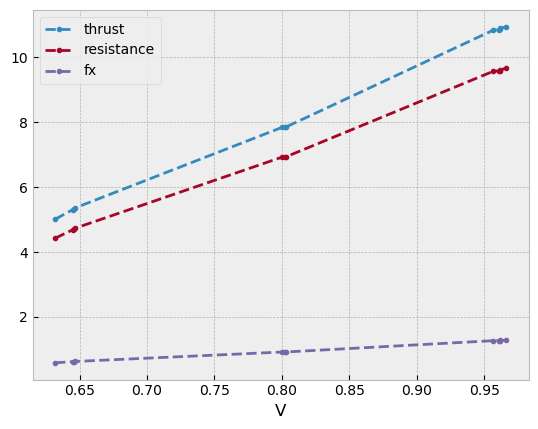

In [20]:
df_reference_speeds.plot(x='V', y=['thrust','resistance','fx'], style='.--')

In [21]:
X = df_reference_speeds[['u']]
X['u**2'] = X['u']**2
y = df_reference_speeds['resistance']
model_resistance = sm.OLS(y, X, hasconst=False)
result_resistance = model_resistance.fit()

In [22]:
result_resistance.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:             resistance   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          1.899e+05
Date:                Tue, 02 May 2023   Prob (F-statistic):                    1.27e-23
Time:                        06:59:57   Log-Likelihood:                          21.921
No. Observations:                  12   AIC:                                     -39.84
Df Residuals:                      10   BIC:                                     -38.87
Df Model:                           2                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
u              1.7551      0.102     17.259      0.000       1.529       1.982
u**2           8.5879      0.117     73.303      0.000       8.327       8.849
==============================================================================
Omnibus:                        8.144   Durbin-Watson:                   0.951
Prob(Omnibus):                  0.017   Jarque-Bera (JB):                3.871
Skew:                          -1.228   Prob(JB):                        0.144
Kurtosis:                       4.306   Cond. No.                         13.7
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

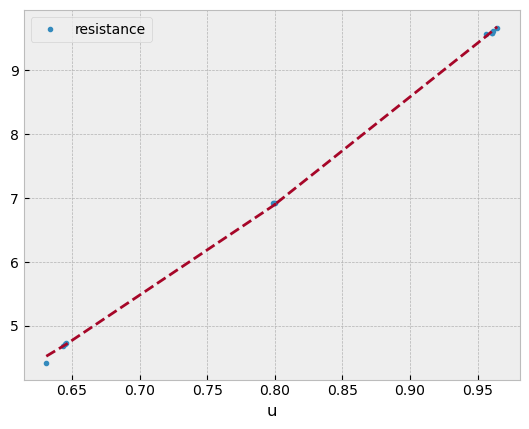

In [23]:
fig,ax=plt.subplots()
df_reference_speeds.plot(x='u', y='resistance', style='.', ax=ax)
ax.plot(df_reference_speeds['u'],result_resistance.predict(X),'--')

In [24]:
prime_system = PrimeSystem(**ship_data)

In [25]:
units={'resistance':'force'}
df_reference_speeds_prime = prime_system.prime(df_reference_speeds[['u','v','r','U','delta','thrust','resistance']], U=df_reference_speeds['U'], units=units)
X = pd.DataFrame(index=df_reference_speeds_prime.index)
X['Xu'] = df_reference_speeds_prime['u']
y = -df_reference_speeds_prime['resistance']
model_resistance = sm.OLS(y, X, hasconst=False)
result_resistance = model_resistance.fit()

In [26]:
result_resistance.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:             resistance   R-squared (uncentered):                   0.999
Model:                            OLS   Adj. R-squared (uncentered):              0.999
Method:                 Least Squares   F-statistic:                              8991.
Date:                Tue, 02 May 2023   Prob (F-statistic):                    2.24e-17
Time:                        06:59:58   Log-Likelihood:                          107.96
No. Observations:                  12   AIC:                                     -213.9
Df Residuals:                      11   BIC:                                     -213.4
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Xu            -0.0009   9.05e-06    -94.820      0.000      -0.001      -0.001
==============================================================================
Omnibus:                        3.819   Durbin-Watson:                   0.240
Prob(Omnibus):                  0.148   Jarque-Bera (JB):                1.251
Skew:                          -0.261   Prob(JB):                        0.535
Kurtosis:                       1.507   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<Axes: xlabel='u'>

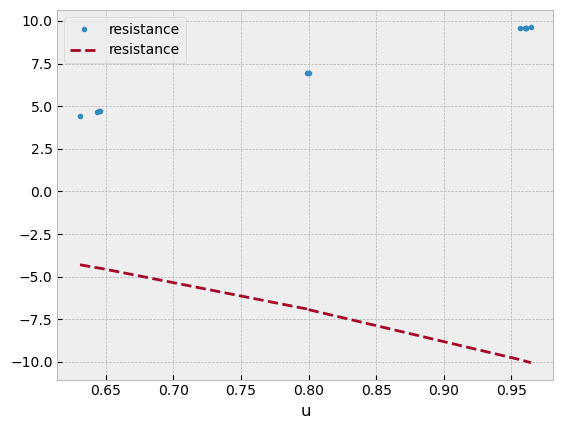

In [27]:
df_reference_speeds_prime_predict = df_reference_speeds_prime.copy()
df_reference_speeds_prime_predict['resistance'] = result_resistance.predict(X)
df_reference_speeds_predict = prime_system.unprime(df_reference_speeds_prime_predict, U=df_reference_speeds['U'], units=units)
fig,ax=plt.subplots()
df_reference_speeds.plot(x='u', y='resistance', style='.', ax=ax)
df_reference_speeds_predict.plot(x='u',y='resistance', style='--',ax=ax)

In [28]:
regression.model_X.params

Xu            -0.000737
Xdeltadelta   -0.002388
Xvr           -0.002060
dtype: float64

In [29]:
result_resistance.params

Xu   -0.000858
dtype: float64

In [30]:
#id = 22773
#id = 22607
#id = 22764
id = 22772
#id = 22774
data_raw = time_series[str(id)]()
data = load(raw_data=data_raw)
data = add_thrust(data, thrust_channels=thrust_keys)

In [31]:
simulator = Simulator(X_eq=vmm.X_eq, Y_eq=vmm.Y_eq, N_eq=vmm.N_eq)

In [32]:
parameters_ = parameters.copy()
#parameters_['Ndelta']*=-1
parameters_['Nthrust']=0
parameters_['Nvvdelta']=0
parameters_['Ythrust']=0
parameters_['Yvvdelta']=0
parameters_['Yvvv']=0
parameters_['Nrrr']=0
parameters_['Nvvv']=0

model_initial = ModelSimulator(simulator=vmm, 
                               parameters=parameters_, 
                               ship_parameters=ship_data, 
                               control_keys=["delta", "thrust"],
                               prime_system = prime_system)

In [33]:
{key:value for key,value in parameters_.items() if value!=0}

{'Xudot': 0.00017880704448812042,
 'Yvdot': -0.006109387408263365,
 'Yrdot': -0.00030313777458141895,
 'Nvdot': -0.00012825440172375716,
 'Nrdot': -0.00029867482773178765,
 'Xthrust': 1.0,
 'Yv': -0.009712908347615236,
 'Yr': 0.0024023611364293648,
 'Ydelta': 0.003,
 'Nv': -0.0031839517092233298,
 'Nr': -0.0017188512353564127,
 'Ndelta': -0.0015}

In [34]:
# The initial heading etc. is very important to get a good simulation:
N = 5
data_ = data.copy()
data_.iloc[0][["psi", "u", "v"]] = data_.iloc[0:N][["psi", "u", "v"]].mean()

simulation_initial = model_initial.simulate(data_)

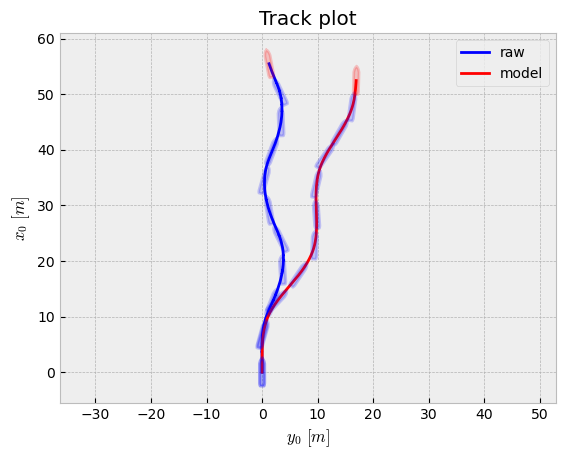

In [35]:
dataframes = {
'raw':data,
'model':simulation_initial.result,
}
track_plots(dataframes=dataframes, lpp=ship_data['L'], beam=ship_data['B']);

In [36]:
system_matrixes = SystemMatrixes(vmm=vmm)
ek = ExtendedKalman(
        vmm=vmm,
        parameters=parameters,
        ship_parameters=ship_data,
        system_matrixes=system_matrixes,
    )

In [37]:
input_columns=['delta']

df_simulate_guess = ek.simulate(data=data_, input_columns=input_columns, solver='Radau')

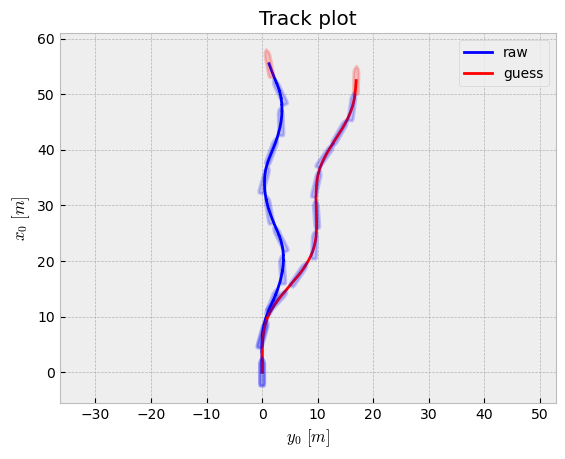

In [38]:
dataframes = {
'raw':data,
'guess':df_simulate_guess,
}
track_plots(dataframes=dataframes, lpp=ship_data['L'], beam=ship_data['B']);

In [39]:
regression.parameters

,regressed,$P_{value}$,$conf_{lower}$,$conf_{higher}$
Ndelta,-0.002510,2.226159e-22,-0.002710,-0.002309
Nr,-0.002276,6.717594e-20,-0.002497,-0.002056
Nrrr,-0.001776,1.516967e-02,-0.003185,-0.000367
Nv,-0.001728,4.251414e-08,-0.002218,-0.001239
Nvvv,0.005319,6.296337e-01,-0.016954,0.027592
Xdeltadelta,-0.002388,2.068730e-04,-0.003553,-0.001223
Xu,-0.000737,3.135733e-36,-0.000760,-0.000714
Xvr,-0.002060,1.139175e-01,-0.004641,0.000521
Ydelta,0.005071,2.757079e-35,0.004919,0.005223
Yr,0.002749,7.523994e-34,0.002657,0.002841


In [40]:
data[['u','v','r','U','delta','thrust']].describe()

,u,v,r,U,delta,thrust
count,7107.000000,7107.000000,7107.000000,7107.000000,7107.000000,7107.000000
mean,0.799902,0.009543,-0.002666,0.813350,0.005389,12.555143
std,0.572493,0.157734,0.065996,0.575343,0.325606,0.795163
min,-0.039162,-0.628297,-0.191680,0.000111,-0.350287,10.349756
25%,0.568837,-0.080040,-0.052349,0.580932,-0.349065,12.117625
50%,0.805090,0.000246,0.000000,0.816122,0.000014,12.688805
75%,1.094602,0.107530,0.043642,1.100282,0.349065,13.129667
max,2.954316,0.500395,0.244419,3.020388,0.349679,14.220057


In [41]:
data.head()

,Arr/Ind/Arr,Arr/Ind/Fri,Fan/Aft/Angle,Fan/Aft/AngleOrder,Fan/Aft/Fx,Fan/Aft/FxOrder,Fan/Aft/Rpm,Fan/Aft/RpmOrder,Fan/ForceFactor,Fan/Fore/Angle,Fan/Fore/AngleOrder,Fan/Fore/Fx,Fan/Fore/FxOrder,Fan/Fore/Rpm,Fan/Fore/RpmOrder,Hull/Acc/X1,Hull/Acc/Y1,Hull/Acc/Y2,Hull/Acc/Z1,Hull/Acc/Z2,Hull/Acc/Z3,Prop/PS/Rpm,Prop/PS/Thrust,Prop/PS/Torque,Prop/SB/Rpm,Prop/SB/Thrust,Prop/SB/Torque,delta,Rudder/MaxAngle,Rudder/Rate,Wind/Course,Wind/CourseTreshold,Wind/GWA,lab/WaveHeight,roll,pitch,psi,x0,y0,z0,u,v,r,u1d,v1d,r1d,V,U,thrust
time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.000000,0.0,1.0,2.146755,0.000027,0.187446,0.0,-0.520477,10.131507,1.0,2.146755,-0.000706,0.231210,0.0,-8.160022,11.329219,0.021273,-0.030895,0.007658,0.015050,-0.007220,0.012022,9.558658,5.450189,-0.108403,9.564930,5.347577,0.100852,0.000014,0.645772,14.89,-0.000144,0.1,0.0,0.000125,0.000890,-0.000171,-0.000611,0.000000,0.000000,0.002440,1.055183,-0.002299,0.008743,81.820579,0.804638,-2.624292,1.055185,1.055185,10.797766
0.009981,0.0,1.0,2.146755,0.000035,0.037287,0.0,0.212813,10.131507,1.0,2.146755,-0.000929,0.206990,0.0,-6.481174,11.329219,-0.010323,0.089009,0.017337,0.033088,0.010187,0.044245,9.574600,5.416779,-0.111748,9.556027,5.263566,0.099891,0.000014,0.645772,14.89,-0.000190,0.1,0.0,0.000125,0.000850,0.000083,-0.000524,0.010532,-0.000029,0.002590,1.871834,0.005732,-0.017450,-185.046078,-0.819988,2.615554,1.871843,1.871843,10.680344
0.019983,0.0,1.0,2.146755,0.000044,-0.170115,0.0,-0.366100,10.131507,1.0,2.146755,-0.001154,0.015996,0.0,-5.689993,11.329219,-0.014837,0.063223,0.017983,0.046616,0.009542,0.031356,9.653423,5.444381,-0.114711,9.565278,5.233857,0.100988,0.000020,0.645772,14.89,-0.000236,0.1,0.0,0.000125,0.000868,-0.000135,-0.000698,0.029254,0.000018,0.002538,0.021003,-0.002469,0.008711,77.649637,0.252639,-0.869531,0.021148,0.021148,10.678238
0.030001,0.0,1.0,2.146755,0.000052,-0.285948,0.0,-0.173129,10.131507,1.0,2.146755,-0.001382,-0.180430,0.0,0.157031,11.329219,0.005152,0.072248,0.005076,0.054991,0.022437,0.019756,9.623491,5.517160,-0.116242,9.534870,5.259566,0.103520,0.000014,0.645772,14.89,-0.000283,0.1,0.0,0.000125,0.000850,0.000102,-0.000611,0.029464,-0.000007,0.002512,0.798897,0.000062,0.000000,31.057636,0.054568,0.000000,0.798897,0.798897,10.776726
0.039983,0.0,1.0,2.146755,0.000061,-0.218993,0.0,0.367190,10.131507,1.0,2.146755,-0.001606,-0.232356,0.0,-1.830571,11.329219,-0.010968,0.065157,0.014756,0.029223,0.016634,0.015245,9.603952,5.616301,-0.115943,9.572603,5.323262,0.106590,0.000014,0.645772,14.89,-0.000329,0.1,0.0,0.000125,0.000831,-0.000185,-0.000611,0.037439,-0.000011,0.002615,1.108915,0.000606,0.000000,80.137449,0.489742,-1.743934,1.108915,1.108915,10.939563


In [42]:
df_forces = regression.predict(data=data[['u','v','r','U','delta','thrust']])
df_forces = df_forces.rolling(window=200).median().dropna()

<Axes: xlabel='time'>

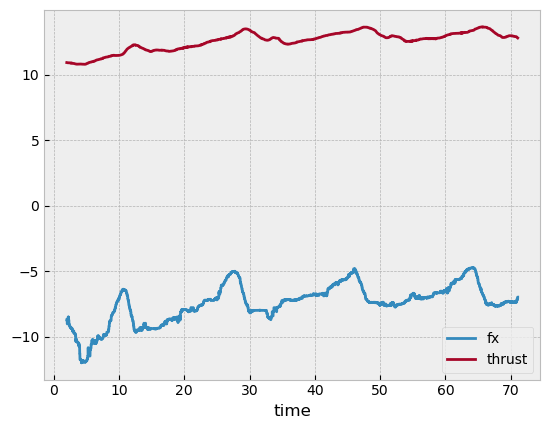

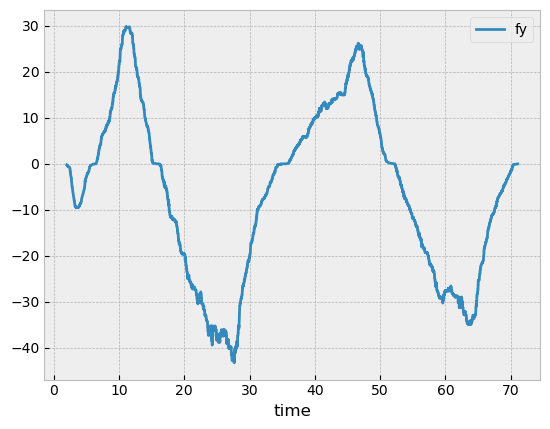

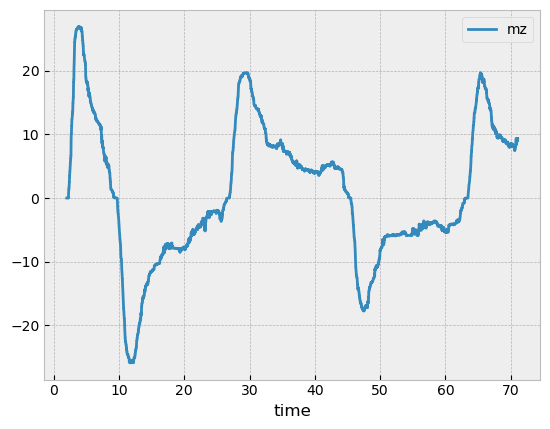

In [43]:
df_forces.plot(y=['fx','thrust'])
df_forces.plot(y='fy')
df_forces.plot(y='mz')

In [44]:
model = regression.create_model(
        control_keys=["delta", "thrust"],
    )
model.parameters['Xu']=result_resistance.params['Xu']  # borrow resistance from MDL

In [45]:
compare = pd.concat((pd.Series(model.parameters, name='regression'),
           pd.Series(model_initial.parameters, name='guess')), axis=1)

In [46]:
mask = compare.index.str.contains('X')
compare.loc[mask]

,regression,guess
Xudot,0.000179,0.000179
Xdeltadelta,-0.002388,0.000000
Xu,-0.000858,0.000000
Xvr,-0.002060,0.000000
Xrr,NaN,0.000000


In [47]:
simulation = model.simulate(data_)

In [51]:
model.save("model_wPCC_abkowitz_simplified_VCT.pkl")

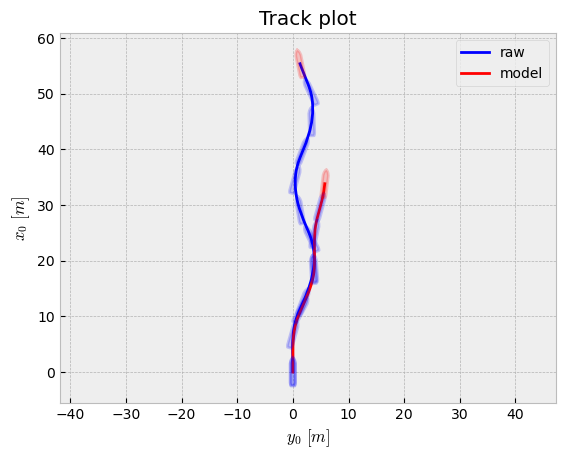

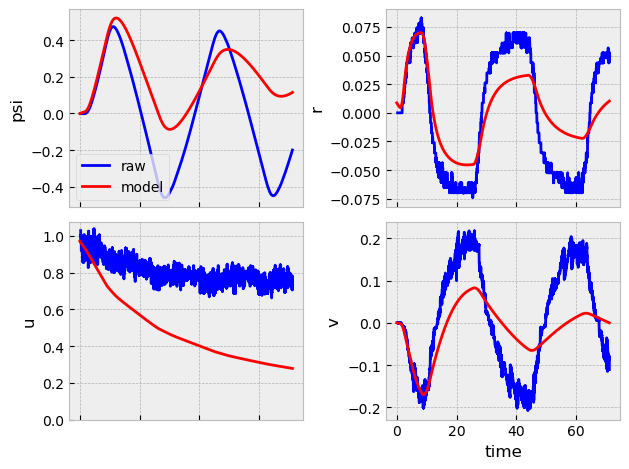

In [49]:
dataframes = {
'raw':data.rolling(window=30).median().dropna(),
'model':simulation.result,
}
track_plots(dataframes=dataframes, lpp=ship_data['L'], beam=ship_data['B']);
plot(dataframes, keys=['u','v','r','psi']);

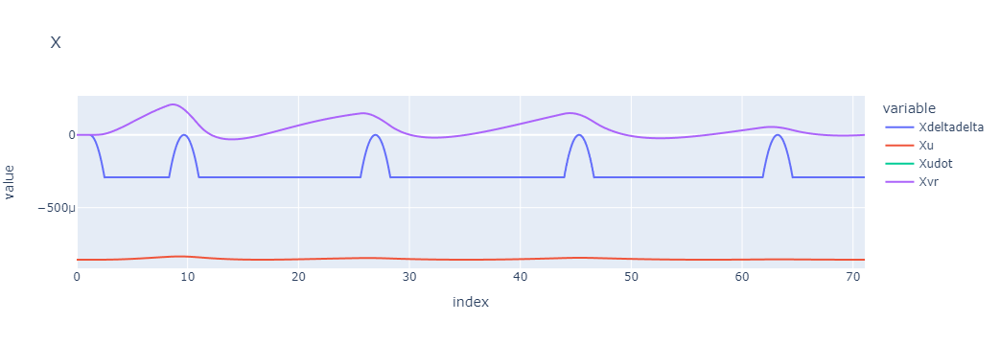

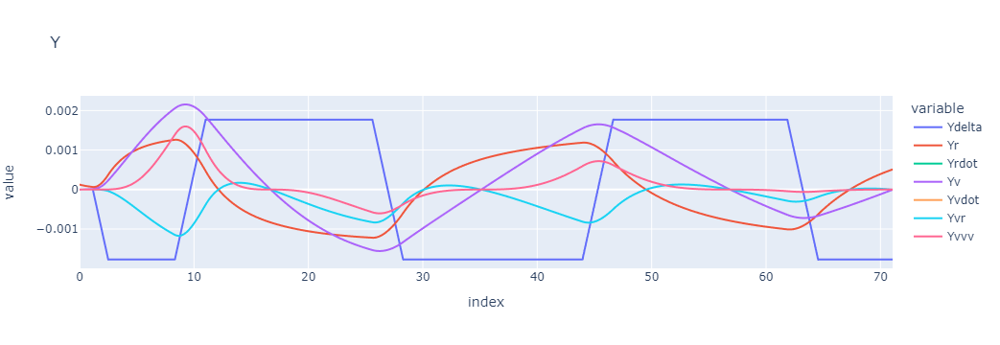

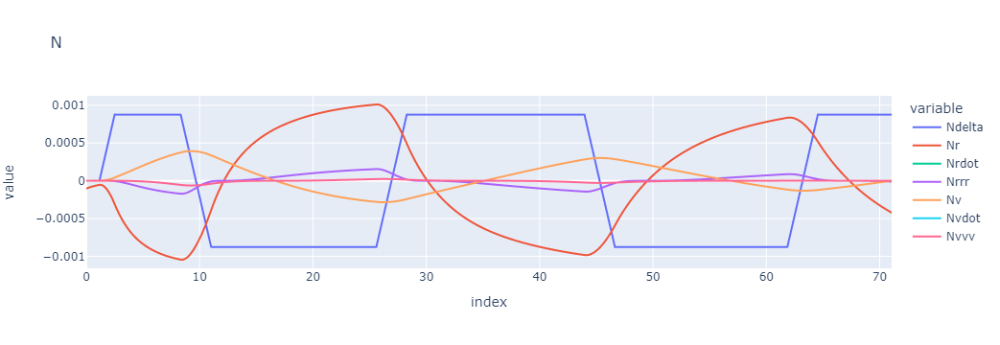

In [50]:
simulation.plot_parameter_contributions(to_mlflow=False)